<a href="https://colab.research.google.com/github/Bunnybunny1120/Deep_learning_project/blob/main/Covid19__Chest_X_ray_Multi_Class_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Loading Dataset
The dataset is downloaded from {https://darwin.v7labs.com/v7-labs/covid-19-chest-x-ray-dataset?sort=priority\%3Adesc}.
The data entitled as '`darwin dataset pull v7-labs/covid-19-chest-x-ray-dataset:all-images`' will be used in this project. All dataset consist of about 6400 images. We extract the images of 4 classes (Bacterial Pneumonia, Viral Pneumonia, No Pneumonia (healthy), Covid-19) and save them as .npy file:

In [ ]:
# importing modules
import numpy as np
import pandas as pd
import glob
import json
import urllib.request
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers

# all-images file are uploaded to the same file
imageNames = glob.glob("/content/drive/MyDrive/all-images/*")

dataset = []
labels = []

for i, imName in enumerate(imageNames):

    # Opening JSON file
    f = open(imName)
    data = json.load(f)
    for j in range(len(data['annotations'])):

        if 'COVID-19' in (data['annotations'][j]['name']):
          #load images from url
            urllib.request.urlretrieve(data['image']['url'],"img.png")
            img = Image.open("img.png")
            #convert images to grayscale
            imgGray = img.convert('L')
            #resize the image (156x156)
            im = imgGray.resize((156,156), Image.LANCZOS)
            label = data['annotations'][j]['name']
            dataset.append(np.array(im))
            labels.append(label)
            print(label)
            break

        if 'Viral Pneumonia' in (data['annotations'][j]['name']) \
            or 'Bacterial Pneumonia' in (data['annotations'][j]['name']) \
            or 'No Pneumonia (healthy)' in (data['annotations'][j]['name']):
            #load images from url
            urllib.request.urlretrieve(data['image']['url'],"img.png")
            img = Image.open("img.png")
            #convert images to grayscale
            imgGray = img.convert('L')
            #resize the image (156x156)
            im = imgGray.resize((156,156), Image.LANCZOS)
            label = data['annotations'][j]['name']
            dataset.append(np.array(im))
            labels.append(label)
            break

#Convert data shape of (n_of_samples, width, height, 1)
dataset = np.dstack(dataset)
dataset = np.rollaxis(dataset,-1)
labels = np.array(labels)

#convert images gray scale to rgb
data = np.array(layers.Lambda(tf.image.grayscale_to_rgb)(tf.expand_dims(dataset, -1)))

# save data and labels into a folder
np.save("/content/drive/MyDrive/data_Updated.npy", data)
np.save("/content/drive/MyDrive/labels_Updated.npy", labels)


Loding saved data and labels from the directory.

In [ ]:
data = np.load('/content/drive/MyDrive/Colab Notebooks/data.npy')
labels = np.load('/content/drive/MyDrive/Colab Notebooks/labels.npy')
print(data.shape)
print(labels.shape)

(6405, 156, 156, 3)
(6405,)


# Preprocessing Steps



Inspect labels and unique counts, label hot-encoding

In [ ]:
#label hot-encoding (part of preprocessing)
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from collections import Counter

print("Unique class names before encoding:")
print(np.unique(labels))

# Use LabelEncoder to convert characters to numerical labels
label_encoder = LabelEncoder()
numerical_labels = label_encoder.fit_transform(labels)

# Determine the number of unique classes
num_classes = len(np.unique(numerical_labels))

# Convert numerical labels to one-hot encoded format
y = to_categorical(numerical_labels, num_classes=num_classes)

print("\nOriginal labels:")
print(labels)

print("\nNumerical labels:")
print(numerical_labels)

print("\nOne-hot encoded labels:")
print(y)

# Display label counts
label_counts = Counter(labels)
print("\nLabel Counts:")
print(label_counts)

Unique class names before encoding:
['Bacterial Pneumonia' 'COVID-19' 'No Pneumonia (healthy)'
 'Viral Pneumonia']

Original labels:
['No Pneumonia (healthy)' 'Bacterial Pneumonia' 'No Pneumonia (healthy)'
 ... 'Bacterial Pneumonia' 'Bacterial Pneumonia' 'Bacterial Pneumonia']

Numerical labels:
[2 0 2 ... 0 0 0]

One-hot encoded labels:
[[0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 ...
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]

Label Counts:
Counter({'Bacterial Pneumonia': 2822, 'Viral Pneumonia': 1846, 'No Pneumonia (healthy)': 1610, 'COVID-19': 127})


Inspect 20 images of covid-19 x-rays

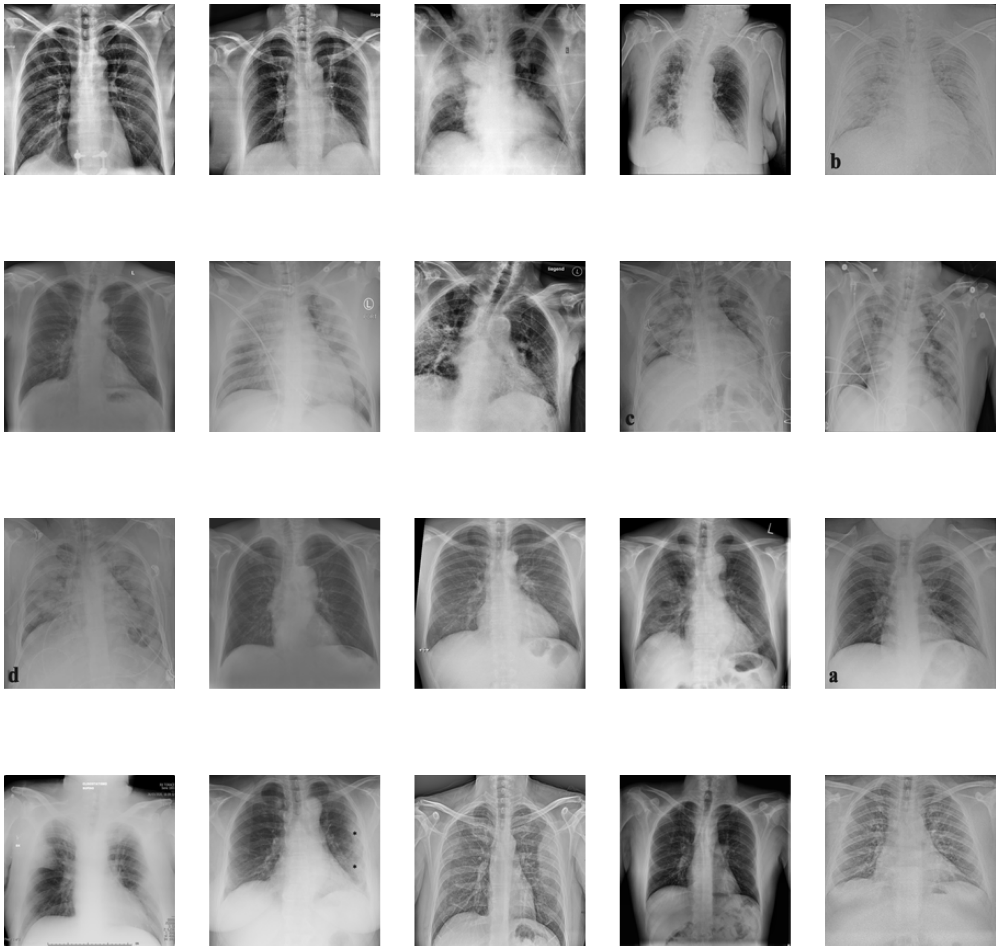

In [ ]:
import matplotlib.pyplot as plt
# Define the category you want to filter
target_category = 'COVID-19'

# Get the index of the target category in the one-hot encoded labels
target_category_index = 1  # Replace with the correct index for 'COVID-19'

# Find the indices of images that belong to the target category
target_indices = np.where(y[:, target_category_index] == 1)[0]

# Extract the images corresponding to the target category
target_images = [data[i] for i in target_indices]

# Create a 4x5 grid of subplots and display the first 20 images
fig, ax = plt.subplots(4, 5, figsize=(30, 30))

# Limit the loop iterations to the minimum between 20 and the number of available images
num_images_to_display = min(20, len(target_images))

for i in range(num_images_to_display):
    row = i // 5
    col = i % 5
    ax[row, col].imshow(target_images[i], cmap='gray')
    ax[row, col].axis('off')

# Turn off any remaining empty subplots if there are fewer than 20 images
for i in range(num_images_to_display, 20):
    row = i // 5
    col = i % 5
    ax[row, col].axis('off')

plt.show()



Inspect 20 images of No Pneumonia (healthy)

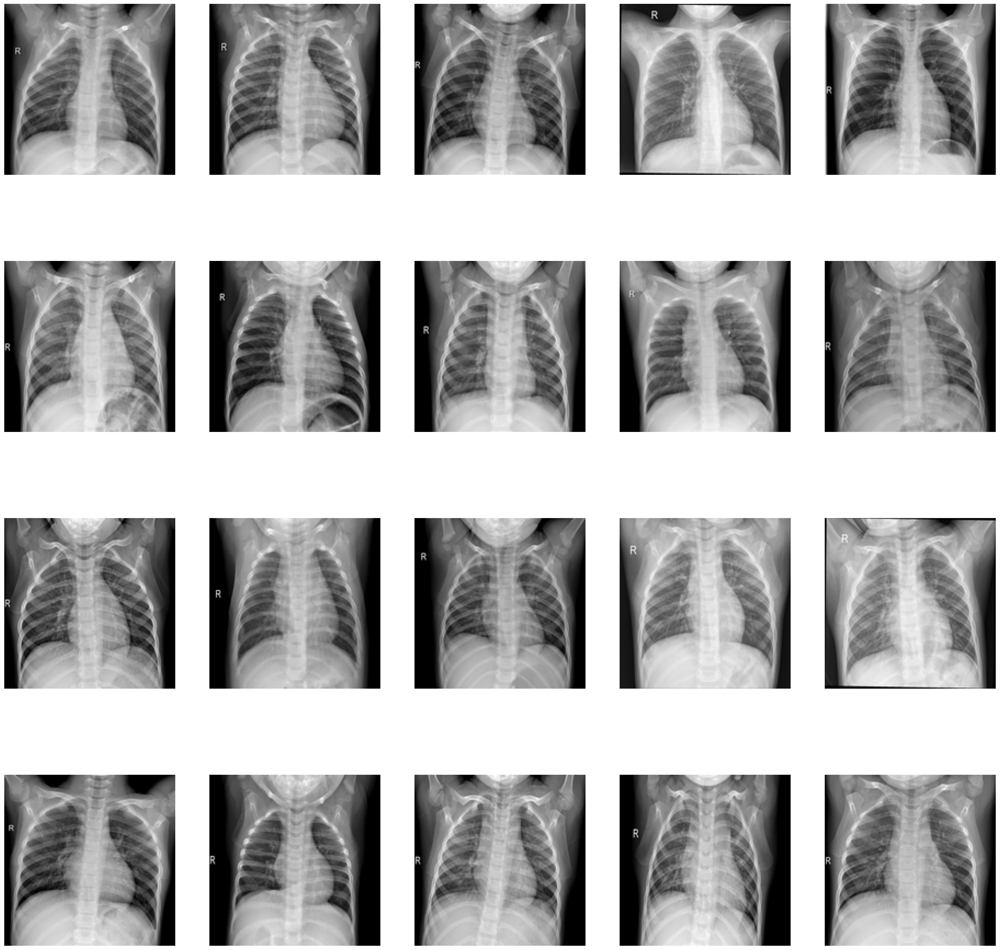

In [ ]:
# Define the category you want to filter
target_category = 'No Pneumonia (healthy)'

# Get the index of the target category in the one-hot encoded labels
target_category_index = 2  # Replace with the correct index for 'No Pneumonia (healthy)'

# Find the indices of images that belong to the target category
target_indices = np.where(y[:, target_category_index] == 1)[0]

# Extract the images corresponding to the target category
target_images = [data[i] for i in target_indices]

# Create a 4x5 grid of subplots and display the first 20 images
fig, ax = plt.subplots(4, 5, figsize=(30, 30))

# Limit the loop iterations to the minimum between 20 and the number of available images
num_images_to_display = min(20, len(target_images))

for i in range(num_images_to_display):
    row = i // 5
    col = i % 5
    ax[row, col].imshow(target_images[i], cmap='gray')
    ax[row, col].axis('off')

# Turn off any remaining empty subplots if there are fewer than 20 images
for i in range(num_images_to_display, 20):
    row = i // 5
    col = i % 5
    ax[row, col].axis('off')

plt.show()

Inpsect 20 Viral Pneumonia images

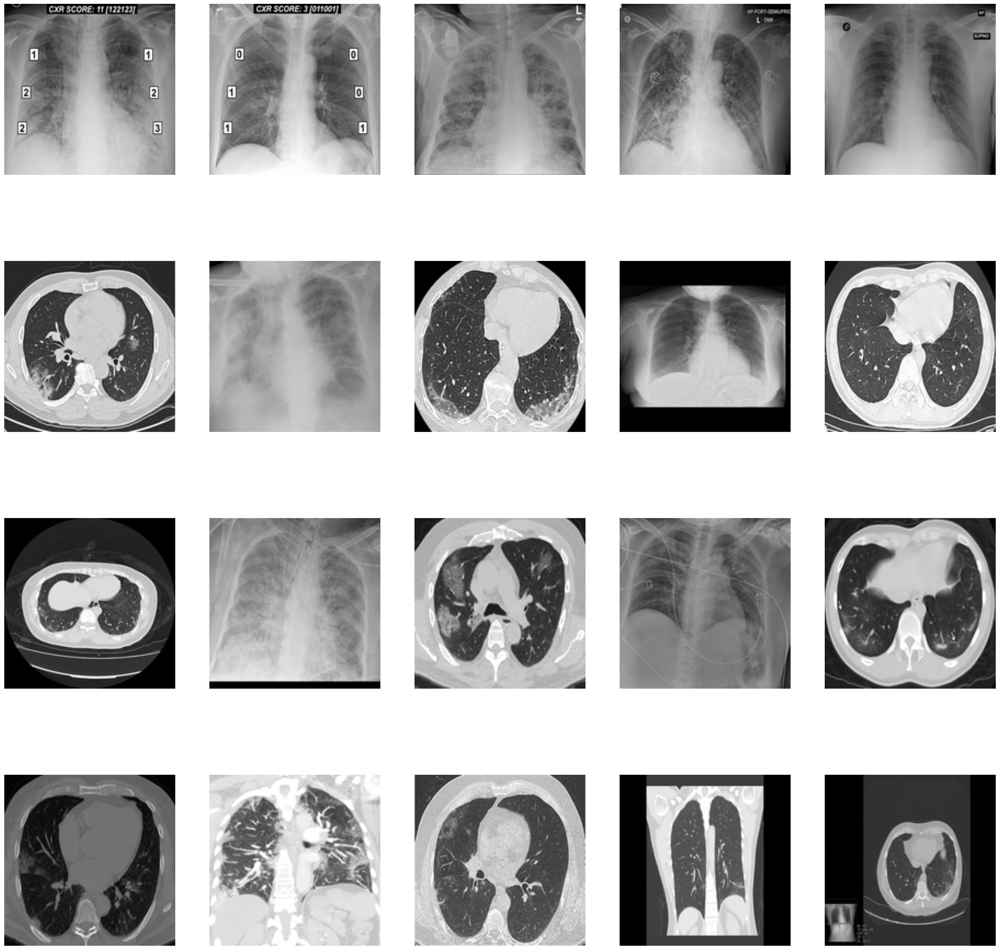

In [ ]:
# Define the category you want to filter
target_category = 'Viral Pneumonia'

# Get the index of the target category in the one-hot encoded labels
target_category_index = 3  # Replace with the correct index for 'Viral Pneumonia'

# Find the indices of images that belong to the target category
target_indices = np.where(y[:, target_category_index] == 1)[0]

# Extract the images corresponding to the target category
target_images = [data[i] for i in target_indices]

# Create a 4x5 grid of subplots and display the first 20 images
fig, ax = plt.subplots(4, 5, figsize=(30, 30))

# Limit the loop iterations to the minimum between 20 and the number of available images
num_images_to_display = min(20, len(target_images))

for i in range(num_images_to_display):
    row = i // 5
    col = i % 5
    ax[row, col].imshow(target_images[i], cmap='gray')
    ax[row, col].axis('off')

# Turn off any remaining empty subplots if there are fewer than 20 images
for i in range(num_images_to_display, 20):
    row = i // 5
    col = i % 5
    ax[row, col].axis('off')

plt.show()


Inspect 20 images of Bacterial Pneumonia


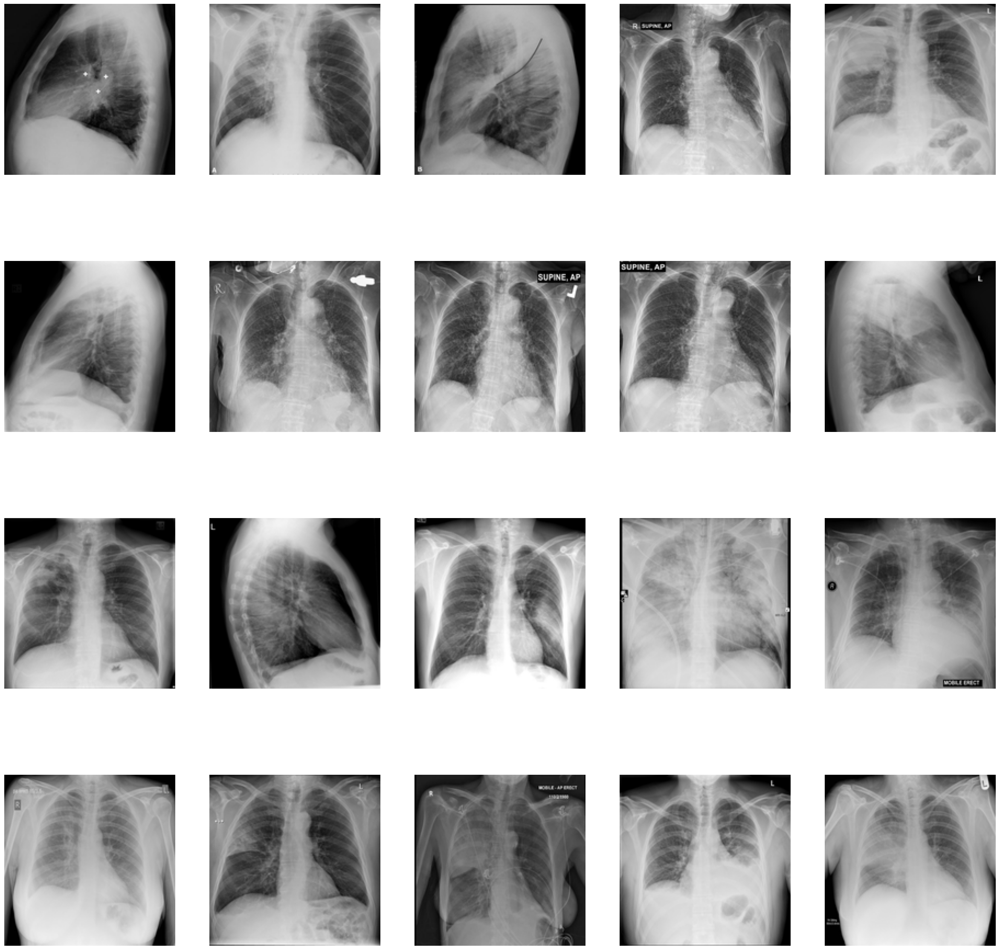

In [ ]:
# Define the category you want to filter
target_category = 'Bacterial Pneumonia'

# Get the index of the target category in the one-hot encoded labels
target_category_index = 0  # Replace with the correct index for 'Bacterial Pneumonia'

# Find the indices of images that belong to the target category
target_indices = np.where(y[:, target_category_index] == 1)[0]

# Extract the images corresponding to the target category
target_images = [data[i] for i in target_indices]

# Create a 4x5 grid of subplots and display the first 20 images
fig, ax = plt.subplots(4, 5, figsize=(30, 30))

# Limit the loop iterations to the minimum between 20 and the number of available images
num_images_to_display = min(20, len(target_images))

for i in range(num_images_to_display):
    row = i // 5
    col = i % 5
    ax[row, col].imshow(target_images[i], cmap='gray')
    ax[row, col].axis('off')

# Turn off any remaining empty subplots if there are fewer than 20 images
for i in range(num_images_to_display, 20):
    row = i // 5
    col = i % 5
    ax[row, col].axis('off')

plt.show()


In [ ]:
# this is already done before the image preview
print("\nOne-hot encoded labels:")
print(y)


One-hot encoded labels:
[[0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 ...
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]]


## Splitting Data

In [ ]:
# Training set (60%), Validation set (20%), Test set (20%)
# stratify keeps the same percentages of classes in each split.
from sklearn.model_selection import train_test_split

X_trainval, X_test, y_trainval, y_test = train_test_split(data, y, test_size = 0.2, stratify=y, random_state = 42)
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size = 0.25, stratify=y_trainval, random_state = 42)

print(' training set shape:  ', X_train.shape, '\n', 'validation set shape:', X_val.shape, '\n','test set shape:      ', X_test.shape)

 training set shape:   (3843, 156, 156, 3) 
 validation set shape: (1281, 156, 156, 3) 
 test set shape:       (1281, 156, 156, 3)


## Normalize Data

In [ ]:
# convert from integers to floats
X_train_f = X_train.astype('float32')
X_val_f = X_val.astype('float32')
X_test_f = X_test.astype('float32')


# normalize to range 0-1
X_train_n = X_train_f/ 255.0
X_val_n = X_val_f / 255.0
X_test_n = X_test_f / 255.0


# Create Baseline Model

In [ ]:
from tensorflow.keras import Sequential, layers, models
# Create a sequential model
model = Sequential()
# Add convolutional and pooling layers
model.add(layers.Conv2D(64, (3, 3), activation='relu',  padding='same', input_shape = X_train_n.shape[1:]))
model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
model.add(layers.Conv2D(32, (3, 3), padding='same', activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
# Add a Flatten layer to the model
model.add(layers.Flatten())
# Add a Dense layer with 32 units and relu activation
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(32, activation='relu'))
# Add the last Dense layer.
model.add(layers.Dense(4, activation='softmax'))

# Analyze the performance of the baseline model

Epoch 1/20
121/121 [==============================] - 5s 19ms/step - loss: 1.0018 - accuracy: 0.5425 - val_loss: 0.7586 - val_accuracy: 0.7018
Epoch 2/20
121/121 [==============================] - 2s 15ms/step - loss: 0.6971 - accuracy: 0.7138 - val_loss: 0.6166 - val_accuracy: 0.7494
Epoch 3/20
121/121 [==============================] - 2s 15ms/step - loss: 0.6175 - accuracy: 0.7450 - val_loss: 0.5898 - val_accuracy: 0.7650
Epoch 4/20
121/121 [==============================] - 2s 15ms/step - loss: 0.5400 - accuracy: 0.7793 - val_loss: 0.6499 - val_accuracy: 0.7260
Epoch 5/20
121/121 [==============================] - 2s 15ms/step - loss: 0.5034 - accuracy: 0.7890 - val_loss: 0.5944 - val_accuracy: 0.7744
Epoch 6/20
121/121 [==============================] - 2s 15ms/step - loss: 0.4748 - accuracy: 0.8028 - val_loss: 0.5694 - val_accuracy: 0.7721
Epoch 7/20
121/121 [==============================] - 2s 15ms/step - loss: 0.4340 - accuracy: 0.8165 - val_loss: 0.6711 - val_accuracy: 0.7369

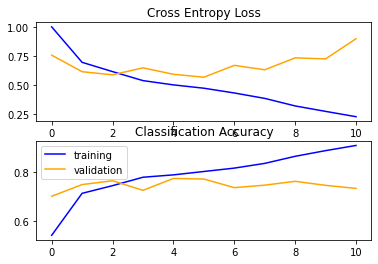

In [ ]:
from keras.callbacks import EarlyStopping
# Define early stopping callback
early_stop = EarlyStopping(monitor='val_loss', patience=5, verbose=1)

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
history = model.fit(X_train_n, y_train, epochs=20, batch_size=32, validation_data=(X_val_n, y_val), callbacks=[early_stop])
test_loss, test_acc = model.evaluate(X_val_n, y_val)


# plot diagnostic learning curves
def summarize_diagnostics(history):
	# plot loss
	plt.subplot(211)
	plt.title('Cross Entropy Loss')
	plt.plot(history.history['loss'], color='blue', label='train')
	plt.plot(history.history['val_loss'], color='orange', label='test')
	# plot accuracy
	plt.subplot(212)
	plt.title('Classification Accuracy')
	plt.plot(history.history['accuracy'], color='blue', label='train')
	plt.plot(history.history['val_accuracy'], color='orange', label='test')
	plt.legend(['training', 'validation'])
	plt.show()

summarize_diagnostics(history)

ROC | Baseline Model

41/41 [==============================] - 0s 6ms/step


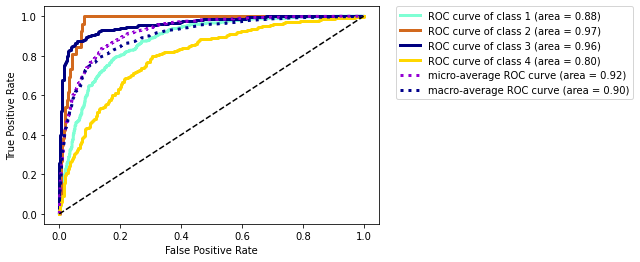

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
from itertools import cycle


# Make predictions on validation data
y_pred = model.predict(X_val_n)
y_true = np.argmax(y_val, axis=1)

# Compute ROC curve and ROC area for each class
fp_rates = {}
tp_rates = {}
roc_auc = {}
for i in range(4):
    fp_rates[i], tp_rates[i], _ = roc_curve(y_true == i, y_pred[:, i])
    roc_auc[i] = auc(fp_rates[i], tp_rates[i])

# Compute micro-average ROC curve and ROC area
fp_rates["micro"], tp_rates["micro"], _ = roc_curve(y_val.ravel(), y_pred.ravel())
roc_auc["micro"] = auc(fp_rates["micro"], tp_rates["micro"])

# Compute macro-average ROC curve and ROC area
all_fpr = np.unique(np.concatenate([fp_rates[i] for i in range(4)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(4):
    mean_tpr += np.interp(all_fpr, fp_rates[i], tp_rates[i])
mean_tpr /= 4
fp_rates["macro"] = all_fpr
tp_rates["macro"] = mean_tpr
roc_auc["macro"] = auc(fp_rates["macro"], tp_rates["macro"])

# Plot ROC curves
plt.figure()
colors = cycle(["aquamarine", "chocolate", "navy", "gold"])
for i, color in zip(range(4), colors):
    plt.plot(
        fp_rates[i],
        tp_rates[i],
        color=color,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i+1, roc_auc[i]),
        linewidth=3
    )

plt.plot(
    fp_rates["micro"],
    tp_rates["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="darkviolet",
    linewidth=3,
    linestyle=":"
)

plt.plot(
    fp_rates["macro"],
    tp_rates["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="darkblue",
    linewidth=3,
    linestyle=":"
)

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
#plt.legend(loc="lower right")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()


Confusion Matrix | Baseline

41/41 [==============================] - 0s 5ms/step


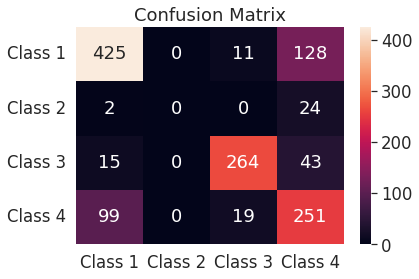

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns

# Make predictions on validation data
y_pred = model.predict(X_val_n)
y_pred = np.argmax(y_pred, axis=1)

# Convert one-hot encoded labels to categorical labels
y_true = np.argmax(y_val, axis=1)

# Create confusion matrix
C_M = confusion_matrix(y_true, y_pred)

# Define labels
labels = {0: "Bacterial Pneumonia", 1: "COVID-19", 2: "No Pneumonia (healthy)", 3: "Viral Pneumonia"}



# Plot confusion matrix
sns.set(font_scale=1.5)
ax = sns.heatmap(C_M, annot=True, fmt="d", xticklabels=labels.values(), yticklabels=labels.values())
ax.set_title("Confusion Matrix")
plt.show()

# Adapting/fine-tuning the network

Tuning with less layers, regularization, class weight, and augmentation

In [ ]:

from tensorflow.keras import regularizers
from keras.optimizers import Adam
from sklearn.utils import class_weight
from tensorflow import keras
from tensorflow.keras import backend as K

In [ ]:

from tensorflow.keras import regularizers
from keras.optimizers import Adam
from sklearn.utils import class_weight
from tensorflow import keras
from tensorflow.keras import backend as K

# Define early stopping callback
early_stop = EarlyStopping(monitor='val_loss', patience=5, verbose=1)

lr = 0.0001
optimizer = Adam(learning_rate=lr)

class_weights = {
    0: 1.0,  # Class 0 has the most samples, so we weight it lower
    1: 8.0,  # Class 1 has the fewest samples, so we weight it higher
    2: 2.0,
    3: 2.0}


# data agumentation
data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal", input_shape=(156, 156, 3)),
    layers.experimental.preprocessing.RandomRotation(0.15),
    layers.experimental.preprocessing.RandomZoom(0.1),
  ]
)


def build_regularized_model(regularizer=regularizers.l2(0.001)):
    model = models.Sequential()
    model.add(data_augmentation)
    model.add(layers.Conv2D(16,(3, 3), activation='relu', padding='same', input_shape = X_train_n.shape[1:]))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(32, (3, 3), kernel_regularizer=regularizer, padding='same', activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Dropout(0.5))
    model.add(layers.Conv2D(8, (3, 3), kernel_regularizer=regularizer, activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(8, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Dropout(0.2))
    model.add(layers.Flatten())
    model.add(layers.Dense(8, kernel_regularizer=regularizer,activation='relu'))
    model.add(layers.Dense(4, activation='softmax'))
    model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])
    return model

# Train the model with default L2 regularization
l2_model = build_regularized_model()
l2_model_hist = l2_model.fit(X_train_n, y_train, epochs=40, batch_size=40, validation_data=(X_val_n, y_val),
                             verbose=1, class_weight=class_weights, callbacks=[early_stop])



Epoch 1/40
97/97 [==============================] - 160s 2s/step - loss: 2.2997 - accuracy: 0.2795 - val_loss: 1.3761 - val_accuracy: 0.2935
Epoch 2/40
97/97 [==============================] - 146s 2s/step - loss: 2.2383 - accuracy: 0.2943 - val_loss: 1.3409 - val_accuracy: 0.2881
Epoch 3/40
97/97 [==============================] - 136s 1s/step - loss: 2.2092 - accuracy: 0.2990 - val_loss: 1.3408 - val_accuracy: 0.2896
Epoch 4/40
97/97 [==============================] - 138s 1s/step - loss: 2.2016 - accuracy: 0.3037 - val_loss: 1.3430 - val_accuracy: 0.2943
Epoch 5/40
97/97 [==============================] - 139s 1s/step - loss: 2.1936 - accuracy: 0.3050 - val_loss: 1.3252 - val_accuracy: 0.2959
Epoch 6/40
97/97 [==============================] - 136s 1s/step - loss: 2.1886 - accuracy: 0.3008 - val_loss: 1.3232 - val_accuracy: 0.3731
Epoch 7/40
97/97 [==============================] - 141s 1s/step - loss: 2.1653 - accuracy: 0.3198 - val_loss: 1.2991 - val_accuracy: 0.3778
Epoch 8/40
97

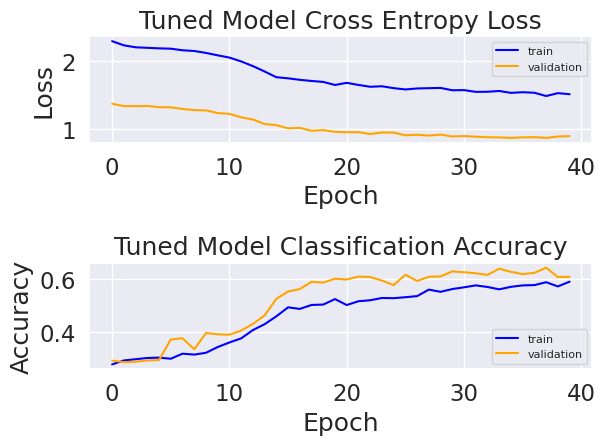

In [ ]:
import matplotlib.pyplot as plt

def summarize_diagnostics(history):
    # plot loss
    plt.subplot(211)
    plt.title('Tuned Model Cross Entropy Loss')
    plt.plot(history['loss'], color='blue', label='train')
    plt.plot(history['val_loss'], color='orange', label='validation')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right', fontsize=8)  # Adjust the font size here

    # plot accuracy
    plt.subplot(212)
    plt.title('Tuned Model Classification Accuracy')
    plt.plot(history['accuracy'], color='blue', label='train')
    plt.plot(history['val_accuracy'], color='orange', label='validation')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right', fontsize=8)  # Adjust the font size here

    plt.tight_layout()  # To avoid overlapping of subplots
    plt.show()


history = l2_model_hist.history
summarize_diagnostics(history)




Tuned model | Confusion Matrix

41/41 [==============================] - 16s 391ms/step


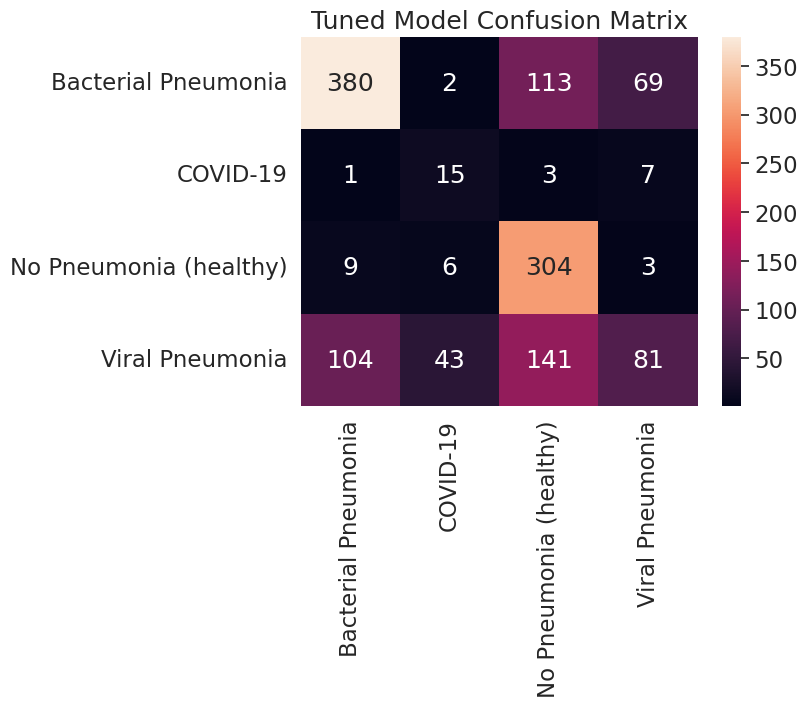

Tuned Model Classification Report:
                        precision    recall  f1-score   support

   Bacterial Pneumonia       0.77      0.67      0.72       564
              COVID-19       0.23      0.58      0.33        26
No Pneumonia (healthy)       0.54      0.94      0.69       322
       Viral Pneumonia       0.51      0.22      0.31       369

              accuracy                           0.61      1281
             macro avg       0.51      0.60      0.51      1281
          weighted avg       0.63      0.61      0.58      1281



In [ ]:

# Make predictions on validation data
y_pred = np.argmax(l2_model.predict(X_val_n), axis=1)


# Convert one-hot encoded labels to categorical labels
y_true = np.argmax(y_val, axis=1)

# Create confusion matrix
C_M = confusion_matrix(y_true, y_pred)

# Define labels
labels = {0: "Bacterial Pneumonia", 1: "COVID-19", 2: "No Pneumonia (healthy)", 3: "Viral Pneumonia"}

# Plot confusion matrix
sns.set(font_scale=1.5)
ax = sns.heatmap(C_M, annot=True, fmt="d", xticklabels=labels.values(), yticklabels=labels.values())
ax.set_title("Tuned Model Confusion Matrix")
plt.show()

# Generate the classification report
target_names = [labels[i] for i in range(len(labels))]
report = classification_report(y_true, y_pred, target_names=target_names)

print("Tuned Model Classification Report:")
print(report)

ROC | tuned model

41/41 [==============================] - 16s 398ms/step


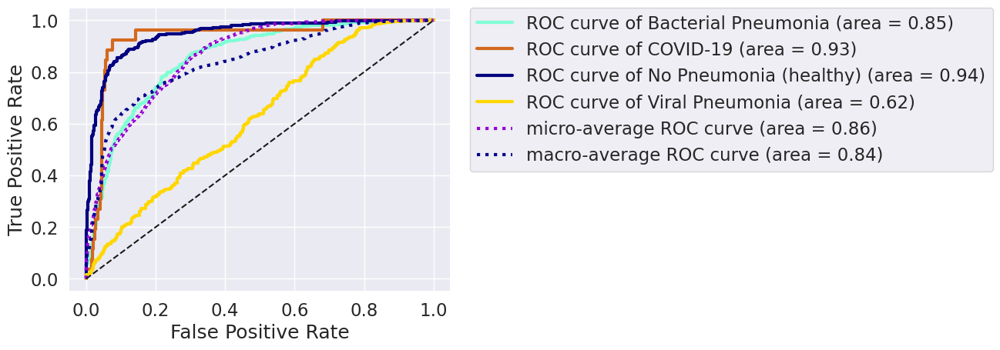

In [ ]:
# Make predictions on validation data to get predicted probabilities
y_probs = l2_model.predict(X_val_n)

# Convert one-hot encoded labels to categorical labels
y_true = np.argmax(y_val, axis=1)

# Define labels
labels = {0: "Bacterial Pneumonia", 1: "COVID-19", 2: "No Pneumonia (healthy)", 3: "Viral Pneumonia"}

# Compute ROC curve and ROC area for each class
fp_rates = {}
tp_rates = {}
roc_auc = {}

for i in range(4):
    fp_rates[i], tp_rates[i], _ = roc_curve(y_true == i, y_probs[:, i])
    roc_auc[i] = auc(fp_rates[i], tp_rates[i])

# Compute micro-average ROC curve and ROC area
fp_rates["micro"], tp_rates["micro"], _ = roc_curve(y_val.ravel(), y_probs.ravel())
roc_auc["micro"] = auc(fp_rates["micro"], tp_rates["micro"])

# Compute macro-average ROC curve and ROC area
all_fpr = np.unique(np.concatenate([fp_rates[i] for i in range(4)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(4):
    mean_tpr += np.interp(all_fpr, fp_rates[i], tp_rates[i])
mean_tpr /= 4
fp_rates["macro"] = all_fpr
tp_rates["macro"] = mean_tpr
roc_auc["macro"] = auc(fp_rates["macro"], tp_rates["macro"])

# Plot ROC curves
plt.figure()
colors = cycle(["aquamarine", "chocolate", "navy", "gold"])
for i, color in zip(range(4), colors):
    plt.plot(
        fp_rates[i],
        tp_rates[i],
        color=color,
        label="ROC curve of {0} (area = {1:0.2f})".format(labels[i], roc_auc[i]),
        linewidth=3
    )

plt.plot(
    fp_rates["micro"],
    tp_rates["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="darkviolet",
    linewidth=3,
    linestyle=":"
)

plt.plot(
    fp_rates["macro"],
    tp_rates["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="darkblue",
    linewidth=3,
    linestyle=":"
)

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()


# Transfer Learning

VGG16

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
from keras.models import Model

vgg_model = VGG16(include_top=False, input_shape = X_train_n.shape[1:])

# mark loaded layers as not trainable
for layer in vgg_model.layers:
	layer.trainable = False

# add new classifier layers
#add flatten layer
flat1 = layers.Flatten()(vgg_model.layers[-1].output)
#add Dense layer
class1 = layers.Dense(128, activation='relu')(flat1)
#add output layer with softmax activation
output = layers.Dense(4, activation='softmax')(class1)
# define new model
vgg_model = Model(inputs=vgg_model.inputs, outputs=output)
# summarize
vgg_model.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 156, 156, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 156, 156, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 156, 156, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 78, 78, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 78, 78, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 78, 78, 128)       147584    
                                                              

VGG_16 | Transfer Learning

In [ ]:
# compile model
#Slight increase of 0.02 % post using AdaDelta
vgg_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# fit model
history_vgg = vgg_model.fit(X_train_n, y_train, validation_data=(X_val_n, y_val), epochs=20, verbose=1)


Epoch 1/20
121/121 [==============================] - 24s 104ms/step - loss: 0.6768 - accuracy: 0.7364 - val_loss: 0.6087 - val_accuracy: 0.7502
Epoch 2/20
121/121 [==============================] - 11s 88ms/step - loss: 0.5294 - accuracy: 0.7827 - val_loss: 0.5208 - val_accuracy: 0.7908
Epoch 3/20
121/121 [==============================] - 13s 109ms/step - loss: 0.4548 - accuracy: 0.8152 - val_loss: 0.5184 - val_accuracy: 0.7900
Epoch 4/20
121/121 [==============================] - 11s 90ms/step - loss: 0.4106 - accuracy: 0.8298 - val_loss: 0.5353 - val_accuracy: 0.7908
Epoch 5/20
121/121 [==============================] - 13s 110ms/step - loss: 0.3682 - accuracy: 0.8473 - val_loss: 0.5098 - val_accuracy: 0.7869
Epoch 6/20
121/121 [==============================] - 13s 111ms/step - loss: 0.3798 - accuracy: 0.8402 - val_loss: 0.4965 - val_accuracy: 0.8072
Epoch 7/20
121/121 [==============================] - 14s 112ms/step - loss: 0.3206 - accuracy: 0.8720 - val_loss: 0.5030 - val_accu

ROC | VGG16

41/41 [==============================] - 3s 67ms/step


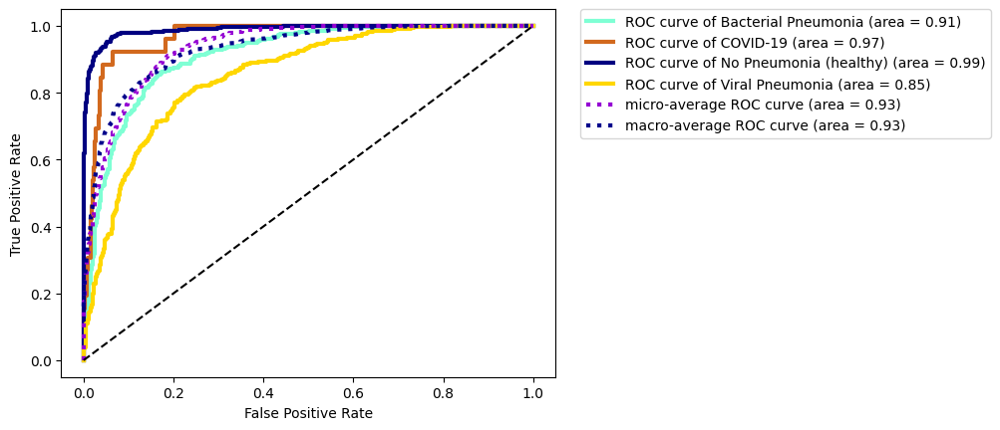

In [ ]:
# Make predictions on validation data to get predicted probabilities
y_probs = vgg_model.predict(X_val_n)

# Convert one-hot encoded labels to categorical labels
y_true = np.argmax(y_val, axis=1)

# Define labels
labels = {0: "Bacterial Pneumonia", 1: "COVID-19", 2: "No Pneumonia (healthy)", 3: "Viral Pneumonia"}

# Compute ROC curve and ROC area for each class
fp_rates = {}
tp_rates = {}
roc_auc = {}

for i in range(4):
    fp_rates[i], tp_rates[i], _ = roc_curve(y_true == i, y_probs[:, i])
    roc_auc[i] = auc(fp_rates[i], tp_rates[i])

# Compute micro-average ROC curve and ROC area
fp_rates["micro"], tp_rates["micro"], _ = roc_curve(y_val.ravel(), y_probs.ravel())
roc_auc["micro"] = auc(fp_rates["micro"], tp_rates["micro"])

# Compute macro-average ROC curve and ROC area
all_fpr = np.unique(np.concatenate([fp_rates[i] for i in range(4)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(4):
    mean_tpr += np.interp(all_fpr, fp_rates[i], tp_rates[i])
mean_tpr /= 4
fp_rates["macro"] = all_fpr
tp_rates["macro"] = mean_tpr
roc_auc["macro"] = auc(fp_rates["macro"], tp_rates["macro"])

# Plot ROC curves
plt.figure()
colors = cycle(["aquamarine", "chocolate", "navy", "gold"])
for i, color in zip(range(4), colors):
    plt.plot(
        fp_rates[i],
        tp_rates[i],
        color=color,
        label="ROC curve of {0} (area = {1:0.2f})".format(labels[i], roc_auc[i]),
        linewidth=3
    )

plt.plot(
    fp_rates["micro"],
    tp_rates["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="darkviolet",
    linewidth=3,
    linestyle=":"
)

plt.plot(
    fp_rates["macro"],
    tp_rates["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="darkblue",
    linewidth=3,
    linestyle=":"
)

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()





Confusion Matrix | VGG16

41/41 [==============================] - 3s 65ms/step


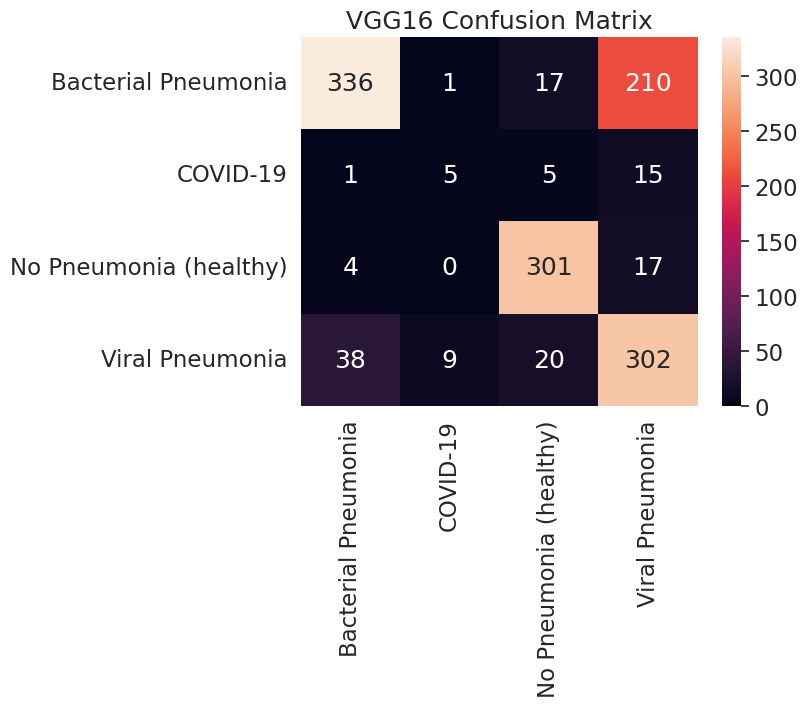

VGG16 Classification Report:
                        precision    recall  f1-score   support

   Bacterial Pneumonia       0.89      0.60      0.71       564
              COVID-19       0.33      0.19      0.24        26
No Pneumonia (healthy)       0.88      0.93      0.91       322
       Viral Pneumonia       0.56      0.82      0.66       369

              accuracy                           0.74      1281
             macro avg       0.66      0.64      0.63      1281
          weighted avg       0.78      0.74      0.74      1281



In [ ]:

# Make predictions on validation data
y_pred = np.argmax(vgg_model.predict(X_val_n), axis=1)


# Convert one-hot encoded labels to categorical labels
y_true = np.argmax(y_val, axis=1)

# Create confusion matrix
C_M = confusion_matrix(y_true, y_pred)

# Define labels
labels = {0: "Bacterial Pneumonia", 1: "COVID-19", 2: "No Pneumonia (healthy)", 3: "Viral Pneumonia"}

# Plot confusion matrix
sns.set(font_scale=1.5)
ax = sns.heatmap(C_M, annot=True, fmt="d", xticklabels=labels.values(), yticklabels=labels.values())
ax.set_title("VGG16 Confusion Matrix")
plt.show()

# Generate the classification report
target_names = [labels[i] for i in range(len(labels))]
report = classification_report(y_true, y_pred, target_names=target_names)

print("VGG16 Classification Report:")
print(report)


ResNet50V2 | Transfer Learning

In [ ]:
from keras.applications import ResNet50V2

resnet50 = ResNet50V2(weights = "imagenet", input_shape = X_train_n.shape[1:], include_top = False)


# mark loaded layers as not trainable
for layer in vgg_model.layers:
	layer.trainable = False

# add new classifier layers
#add flatten layer
flat1 = layers.Flatten()(resnet50.layers[-1].output)
#add Dense layer
class1 = layers.Dense(128, activation='relu')(flat1)
#add output layer with softmax activation
output = layers.Dense(4, activation='softmax')(class1)
# define new model
res_model = Model(inputs=resnet50.inputs, outputs=output)
# summarize
res_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 156, 156, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 162, 162, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 78, 78, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 pool1_pad (ZeroPadding2D)      (None, 80, 80, 64)   0           ['conv1_conv[0][0]']       

In [ ]:
# compile model
#Slight increase of 0.02 % post using AdaDelta
res_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# fit model
history_res = res_model.fit(X_train_n, y_train, validation_data=(X_val_n, y_val), epochs=20, verbose=1)

Epoch 1/20
121/121 [==============================] - 69s 228ms/step - loss: 0.9187 - accuracy: 0.6966 - val_loss: 85.9886 - val_accuracy: 0.2537
Epoch 2/20
121/121 [==============================] - 22s 178ms/step - loss: 0.5839 - accuracy: 0.7632 - val_loss: 2.4598 - val_accuracy: 0.7096
Epoch 3/20
121/121 [==============================] - 22s 184ms/step - loss: 0.6511 - accuracy: 0.7512 - val_loss: 1809.8091 - val_accuracy: 0.4395
Epoch 4/20
121/121 [==============================] - 23s 188ms/step - loss: 0.8294 - accuracy: 0.7023 - val_loss: 1.3761 - val_accuracy: 0.2514
Epoch 5/20
121/121 [==============================] - 22s 178ms/step - loss: 0.6946 - accuracy: 0.7190 - val_loss: 0.6690 - val_accuracy: 0.7315
Epoch 6/20
121/121 [==============================] - 21s 174ms/step - loss: 0.6167 - accuracy: 0.7499 - val_loss: 1.3619 - val_accuracy: 0.2615
Epoch 7/20
121/121 [==============================] - 21s 177ms/step - loss: 0.7007 - accuracy: 0.7239 - val_loss: 1.2915 - va

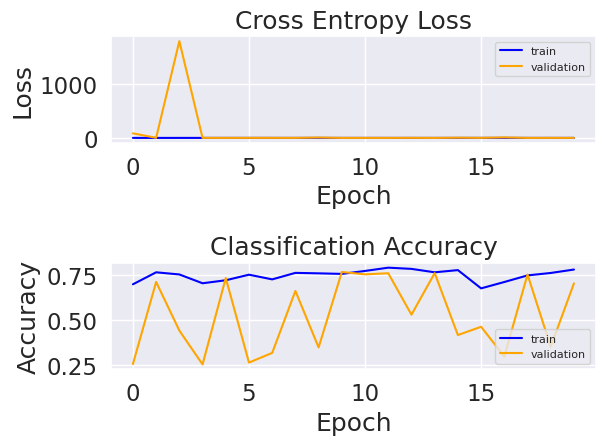

In [ ]:
def summarize_diagnostics(history):
    # plot loss
    plt.subplot(211)
    plt.title('Cross Entropy Loss')
    plt.plot(history['loss'], color='blue', label='train')
    plt.plot(history['val_loss'], color='orange', label='validation')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right', fontsize=8)  # Adjust the font size here

    # plot accuracy
    plt.subplot(212)
    plt.title('Classification Accuracy')
    plt.plot(history['accuracy'], color='blue', label='train')
    plt.plot(history['val_accuracy'], color='orange', label='validation')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right', fontsize=8)  # Adjust the font size here

    plt.tight_layout()  # To avoid overlapping of subplots
    plt.show()


history = history_res.history
summarize_diagnostics(history)

ROC | ResNet50V2

41/41 [==============================] - 7s 111ms/step


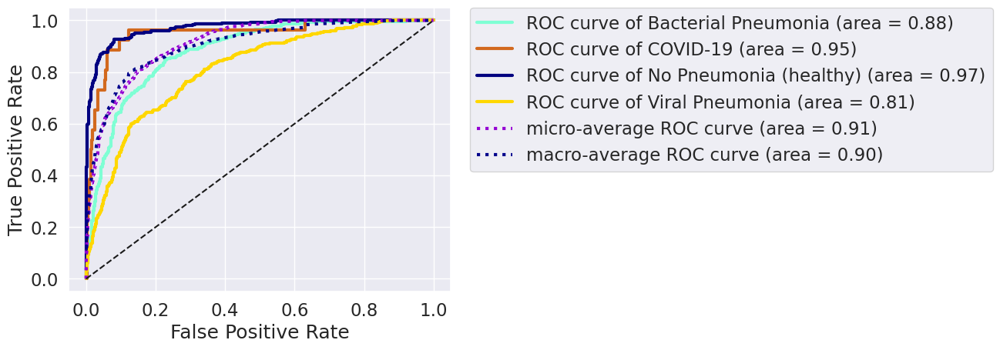

In [ ]:
# Make predictions on validation data to get predicted probabilities
y_probs = res_model.predict(X_val_n)

# Convert one-hot encoded labels to categorical labels
y_true = np.argmax(y_val, axis=1)

# Define labels
labels = {0: "Bacterial Pneumonia", 1: "COVID-19", 2: "No Pneumonia (healthy)", 3: "Viral Pneumonia"}

# Compute ROC curve and ROC area for each class
fp_rates = {}
tp_rates = {}
roc_auc = {}

for i in range(4):
    fp_rates[i], tp_rates[i], _ = roc_curve(y_true == i, y_probs[:, i])
    roc_auc[i] = auc(fp_rates[i], tp_rates[i])

# Compute micro-average ROC curve and ROC area
fp_rates["micro"], tp_rates["micro"], _ = roc_curve(y_val.ravel(), y_probs.ravel())
roc_auc["micro"] = auc(fp_rates["micro"], tp_rates["micro"])

# Compute macro-average ROC curve and ROC area
all_fpr = np.unique(np.concatenate([fp_rates[i] for i in range(4)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(4):
    mean_tpr += np.interp(all_fpr, fp_rates[i], tp_rates[i])
mean_tpr /= 4
fp_rates["macro"] = all_fpr
tp_rates["macro"] = mean_tpr
roc_auc["macro"] = auc(fp_rates["macro"], tp_rates["macro"])

# Plot ROC curves
plt.figure()
colors = cycle(["aquamarine", "chocolate", "navy", "gold"])
for i, color in zip(range(4), colors):
    plt.plot(
        fp_rates[i],
        tp_rates[i],
        color=color,
        label="ROC curve of {0} (area = {1:0.2f})".format(labels[i], roc_auc[i]),
        linewidth=3
    )

plt.plot(
    fp_rates["micro"],
    tp_rates["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="darkviolet",
    linewidth=3,
    linestyle=":"
)

plt.plot(
    fp_rates["macro"],
    tp_rates["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="darkblue",
    linewidth=3,
    linestyle=":"
)

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

Confusion Matrix | ResNet50V2

41/41 [==============================] - 2s 48ms/step


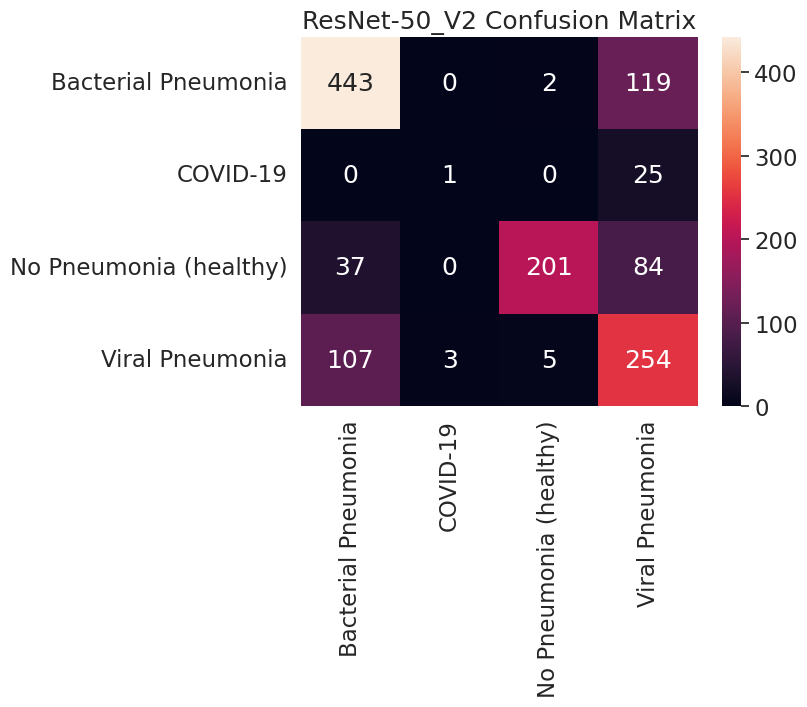

ResNet-50_V2 Classification Report:
                        precision    recall  f1-score   support

   Bacterial Pneumonia       0.75      0.79      0.77       564
              COVID-19       0.25      0.04      0.07        26
No Pneumonia (healthy)       0.97      0.62      0.76       322
       Viral Pneumonia       0.53      0.69      0.60       369

              accuracy                           0.70      1281
             macro avg       0.62      0.53      0.55      1281
          weighted avg       0.73      0.70      0.70      1281



In [ ]:
# Make predictions on validation data
y_pred = np.argmax(res_model.predict(X_val_n), axis=1)


# Convert one-hot encoded labels to categorical labels
y_true = np.argmax(y_val, axis=1)

# Create confusion matrix
C_M = confusion_matrix(y_true, y_pred)

# Define labels
labels = {0: "Bacterial Pneumonia", 1: "COVID-19", 2: "No Pneumonia (healthy)", 3: "Viral Pneumonia"}

# Plot confusion matrix
sns.set(font_scale=1.5)
ax = sns.heatmap(C_M, annot=True, fmt="d", xticklabels=labels.values(), yticklabels=labels.values())
ax.set_title("ResNet-50_V2 Confusion Matrix")
plt.show()

# Generate the classification report
target_names = [labels[i] for i in range(len(labels))]
report = classification_report(y_true, y_pred, target_names=target_names)

print("ResNet-50_V2 Classification Report:")
print(report)
